`Author: Victor Radermecker | Date: 11/10/2021 | Project: Master Thesis`

## Imports

In [11]:
import branca.colormap as cm
import folium
import geopandas as gpd
import pandas as pd
from tqdm.auto import tqdm
import ipywidgets as widgets

tqdm.pandas()
import json

pd.set_option("display.max_columns", 100)

## Global functions and variables

## Geographical Data

In [12]:
# GeoJson Shapefile
sectors_geo = r"../data/maps/prox_neighbor/json/RBC_Neighborhoods_gps.json"

# open the json 
with open(sectors_geo) as sectors_file:
    sectors_json = json.load(sectors_file)

## Values for Choropleth Map

In [13]:
df = pd.read_csv(
    "../data/Proximus/proximusFrequentTrip_RandomlyGenerated.csv",
    encoding="unicode_escape",
)

df.head()

,Unnamed: 0,originNB,destinationNB,regularTripSample,irregularTripSample
0,1,ALTITUDE 100,ALTITUDE 100,242,4066
1,2,ALTITUDE 100,ANDERLECHT CENTRE - WAYEZ,9666,7490
2,3,ALTITUDE 100,ANNEESSENS,556,8981
3,4,ALTITUDE 100,AUDERGHEM CENTRE,9465,7964
4,5,ALTITUDE 100,AVENUE LEOPOLD III,7479,318


In [14]:
print("Number of Neighborhoods in Shapefile: ", len(sectors_json['features']))
print("Number of Neighborhoods in Proximus Dataset: ", len(df['originNB'].unique()))

Number of Neighborhoods in Shapefile:  145
Number of Neighborhoods in Proximus Dataset:  139


## Generate the Choropleth Map 

This map shows the num

In [15]:
origin = "ALTITUDE 100"

for origin in tqdm(df['originNB'].unique()):
    # Adding the population value to each sector of the geojson file
    subdf = df[df["originNB"] == "ALTITUDE 100"]
    for index in range(len(sectors_json["features"])):
        temp_dict = sectors_json["features"][index]["properties"]    
        val = subdf[subdf["destinationNB"] == temp_dict["NAME_FRE"]]["regularTripSample"]
        if val.empty:
            val = 0
        else:
            val = val.item()
        temp_dict[f"RegularTrips_From_{origin}"] = f"Regular Trips From {origin}: " + str(
            val
        )
        sectors_json["features"][index]["properties"] = temp_dict

  0%|          | 0/139 [00:00<?, ?it/s]

In [16]:
origin_w = widgets.Dropdown(
    options=df['originNB'].unique(),
    value='ALTITUDE 100',
    description='Origin:',
    disabled=False,
)
origin_w

Dropdown(description='Origin:', options=('ALTITUDE 100', 'ANDERLECHT CENTRE - WAYEZ', 'ANNEESSENS', 'AUDERGHEM…

In [17]:
# initial map coordinates
coords = [50.84892175574389, 4.3514911042124345]

world = folium.Map(
    location=[coords[0], coords[1]], zoom_start=12.45, tiles="openstreetmap"
)

# add tile layers to the map
tiles = ["stamenwatercolor", "cartodbpositron", "openstreetmap", "stamenterrain"]
for tile in tiles:
    folium.TileLayer(tile).add_to(world)

choropleth = folium.Choropleth(
    geo_data=sectors_json,
    data=df[df["originNB"] == "ALTITUDE 100"],
    columns=["destinationNB", "regularTripSample"],
    key_on="feature.properties.NAME_FRE", 
    fill_color="YlOrRd",
    fill_opacity=0.6,
    line_opacity=0.25,
    legend_name="Regular Trips from {origin} to each neighborhoods of Region Brussels Capital",
    highlight=True,
    smooth_factor=0,
).add_to(world)

# Adding Legend to the map
style_function = "font-size: 15px"
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
        ["NAME_FRE", f"RegularTrips_From_{origin_w.value}"], style=style_function, labels=False
    )
)

# create a layer control
folium.LayerControl().add_to(world)

world

In [18]:
# with open('../data/maps/prox_neighbor/json/RBC_Neighborhoods_gps_preprocessed.json', 'w') as f:
#     json.dump(sectors_json, f)

### With Plotly

Keeping this as a backup but not useful for the moment. Folium seems to work well enough!

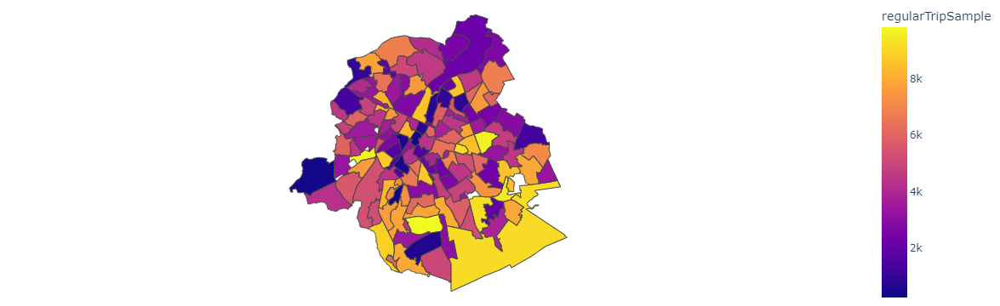

In [25]:
import plotly.express as px

subdf = df[df["originNB"] == "ALTITUDE 100"]


fig = px.choropleth(subdf, geojson=sectors_json, color="regularTripSample",
                    locations="destinationNB", featureidkey="properties.NAME_FRE",
                    projection="mercator"
                   )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()